In [ ]:
!unzip /content/noise_yamnet.zip -d /content/noise_yamnet


Archive:  /content/noise_yamnet.zip
   creating: /content/noise_yamnet/assets/
   creating: /content/noise_yamnet/variables/
  inflating: /content/noise_yamnet/saved_model.pb  
  inflating: /content/noise_yamnet/fingerprint.pb  
  inflating: /content/noise_yamnet/keras_metadata.pb  
  inflating: /content/noise_yamnet/assets/yamnet_class_map.csv  
  inflating: /content/noise_yamnet/variables/variables.data-00000-of-00001  
  inflating: /content/noise_yamnet/variables/variables.index  


In [ ]:
import tensorflow as tf
reloaded_model = tf.saved_model.load('/content/noise_yamnet')

In [ ]:
import numpy as np
import librosa
import soundfile as sf
from scipy.signal import butter, lfilter


# Your classes
my_classes = ["Unwanted", "Wanted"]  # Adjust based on your setup

# Function for low-pass filter
def lowpass_filter(data, cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return lfilter(b, a, data)

# Function to amplify audio
def amplify_audio(data, factor=1.5):
    return data * factor

# Process audio with classification and DSP
def process_audio_with_dsp(audio_file, chunk_duration=1.0, overlap=0.5, sr=16000):
    audio, sr = librosa.load(audio_file, sr=sr, mono=True)
    chunk_size = int(chunk_duration * sr)
    overlap_size = int(overlap * sr)
    step_size = chunk_size - overlap_size  # Step size for the sliding window

    # Initialize an empty array for reconstruction
    processed_audio = np.zeros(len(audio) + chunk_size)  # Add buffer for last chunk
    weight = np.zeros_like(processed_audio)  # Weighting for overlap smoothing

    for start in range(0, len(audio), step_size):
        end = start + chunk_size
        chunk = audio[start:end]

        if len(chunk) < chunk_size:  # Pad the last chunk
            chunk = np.pad(chunk, (0, chunk_size - len(chunk)), mode='constant')

        # Convert to tensor and classify
        chunk_tensor = tf.convert_to_tensor(chunk, dtype=tf.float32)
        result = reloaded_model(chunk_tensor)
        predicted_class = my_classes[tf.math.argmax(result)]

        # Apply DSP based on classification
        if predicted_class == "Wanted":
            processed_chunk = amplify_audio(chunk, factor=1.2)
        else:
            processed_chunk = lowpass_filter(chunk, cutoff=400, fs=sr)

        # Add the processed chunk to the reconstruction buffer
        processed_audio[start:end] += processed_chunk
        weight[start:end] += 1  # Keep track of overlaps for averaging

    # Normalize by the weight to handle overlap averaging
    processed_audio = processed_audio[:len(audio)]  # Trim buffer to original length
    processed_audio /= np.maximum(weight[:len(audio)], 1)  # Avoid division by zero
    return processed_audio, sr


# Run the pipeline
audio_path = '/content/noise_test_AirConditioner_1.wav'
output_audio, sample_rate = process_audio_with_dsp(audio_path, chunk_duration=2, overlap=0.5)

# Save the processed audio
sf.write('processed_audio3.wav', output_audio, sample_rate)

print("Processed audio saved to 'processed_audio.wav'")


Processed audio saved to 'processed_audio.wav'


In [ ]:
from IPython.display import Audio
Audio('/content/noise_test_AirConditioner_1.wav')

In [ ]:
from IPython.display import Audio
Audio('/content/processed_audio3.wav')

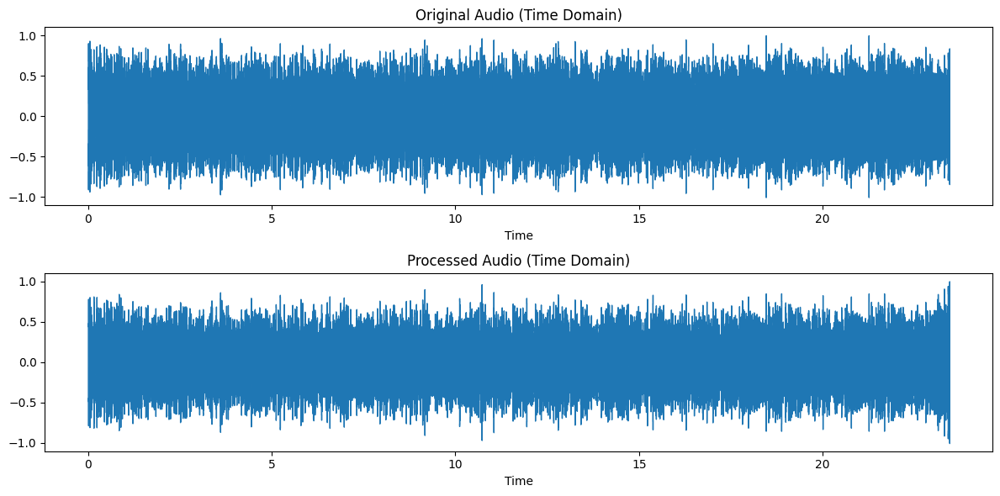

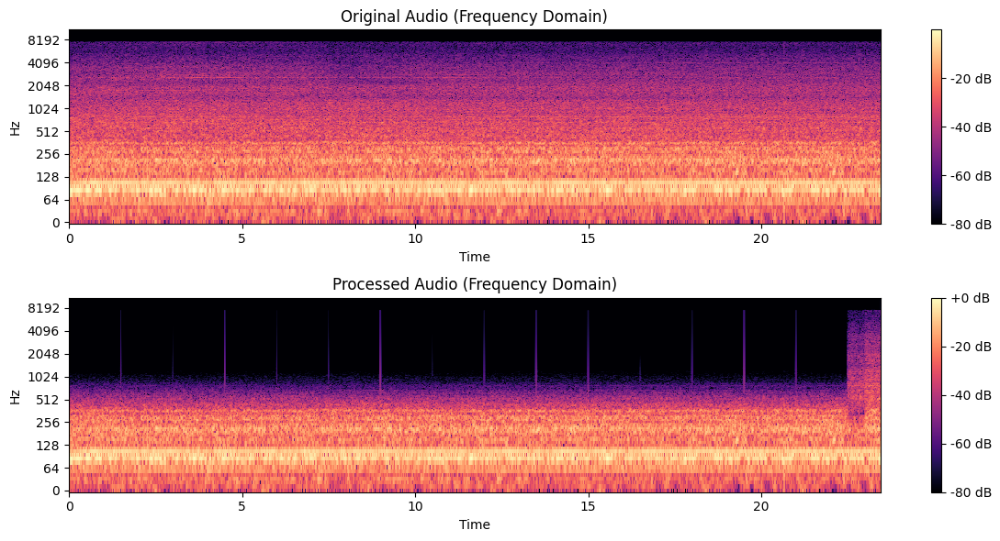

In [ ]:
# prompt: visualize the audio in both time domain and frequency domain

import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np

# Load the original and processed audio files
original_audio, sr = librosa.load('/content/noise_test_AirConditioner_1.wav')
processed_audio, _ = librosa.load('processed_audio3.wav')

# Time domain visualization
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.waveshow(original_audio, sr=sr)
plt.title('Original Audio (Time Domain)')

plt.subplot(2, 1, 2)
librosa.display.waveshow(processed_audio, sr=sr)
plt.title('Processed Audio (Time Domain)')

plt.tight_layout()
plt.show()

# Frequency domain visualization (Spectrogram)
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
D = librosa.amplitude_to_db(np.abs(librosa.stft(original_audio)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Original Audio (Frequency Domain)')

plt.subplot(2, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(processed_audio)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Processed Audio (Frequency Domain)')

plt.tight_layout()
plt.show()

In [ ]:
import subprocess
subprocess.call(['ffmpeg', '-i', '/content/Recording (4).m4a','audio1.wav'])

0

In [ ]:
# Run the pipeline
audio_path = '/content/audio1.wav'
output_audio, sample_rate = process_audio_with_dsp(audio_path, chunk_duration=2, overlap=0.5)

# Save the processed audio
sf.write('processed_audio3.wav', output_audio, sample_rate)

print("Processed audio saved to 'processed_audio.wav'")


Processed audio saved to 'processed_audio.wav'


In [ ]:
from IPython.display import Audio
Audio('/content/audio1.wav')

In [ ]:
from IPython.display import Audio
Audio('/content/processed_audio3.wav')

<ipython-input-17-a8e88898e1e9>:7: UserWarning: PySoundFile failed. Trying audioread instead.
  original_audio, sr = librosa.load('/content/Recording (4).m4a')
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


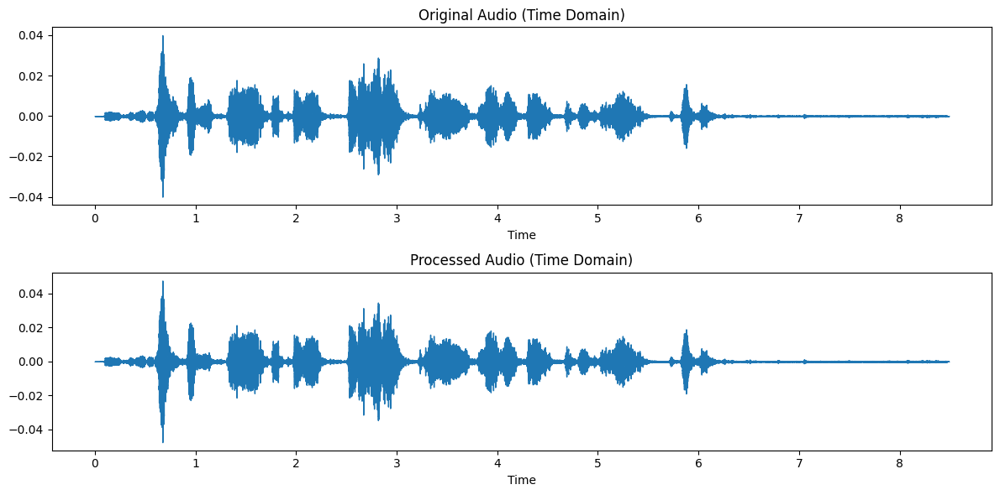

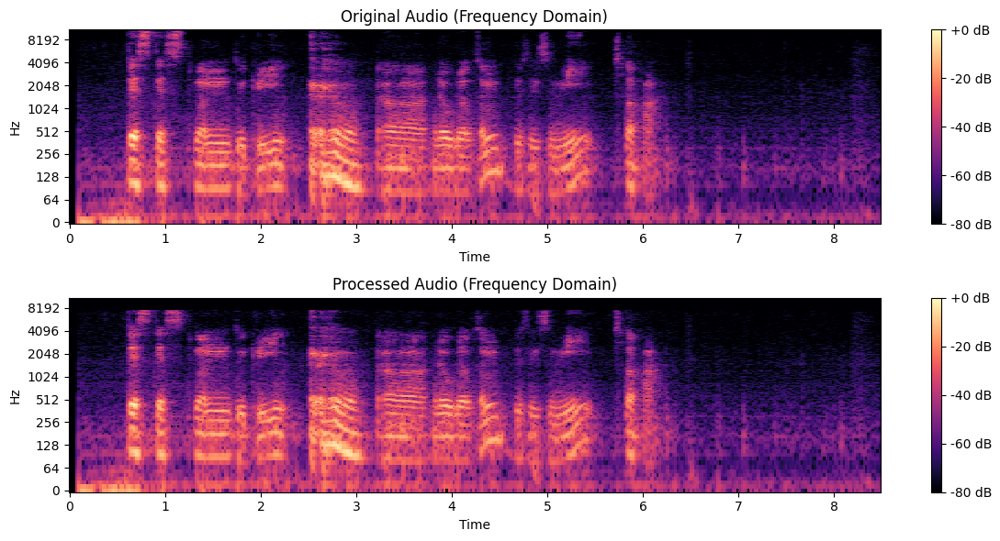

In [ ]:

import matplotlib.pyplot as plt
import librosa
import librosa.display
import numpy as np

# Load the original and processed audio files
original_audio, sr = librosa.load('/content/Recording (4).m4a')
processed_audio, _ = librosa.load('processed_audio3.wav')

# Time domain visualization
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.waveshow(original_audio, sr=sr)
plt.title('Original Audio (Time Domain)')

plt.subplot(2, 1, 2)
librosa.display.waveshow(processed_audio, sr=sr)
plt.title('Processed Audio (Time Domain)')

plt.tight_layout()
plt.show()

# Frequency domain visualization (Spectrogram)
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
D = librosa.amplitude_to_db(np.abs(librosa.stft(original_audio)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Original Audio (Frequency Domain)')

plt.subplot(2, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(processed_audio)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Processed Audio (Frequency Domain)')

plt.tight_layout()
plt.show()

In [ ]:
# Run the pipeline
audio_path = '/content/noise_test_AirportAnnouncements_1.wav'
output_audio, sample_rate = process_audio_with_dsp(audio_path, chunk_duration=2, overlap=0.5)

# Save the processed audio
sf.write('processed_audio2.wav', output_audio, sample_rate)

print("Processed audio saved to 'processed_audio2.wav'")


Processed audio saved to 'processed_audio2.wav'


In [ ]:
from IPython.display import Audio
Audio('/content/noise_test_AirportAnnouncements_1.wav')

In [ ]:
from IPython.display import Audio
Audio('/content/processed_audio2.wav')

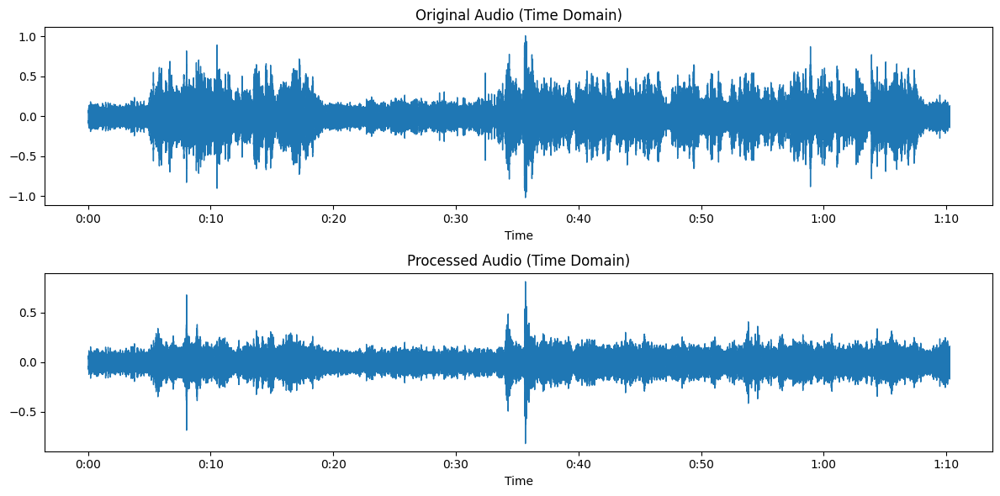

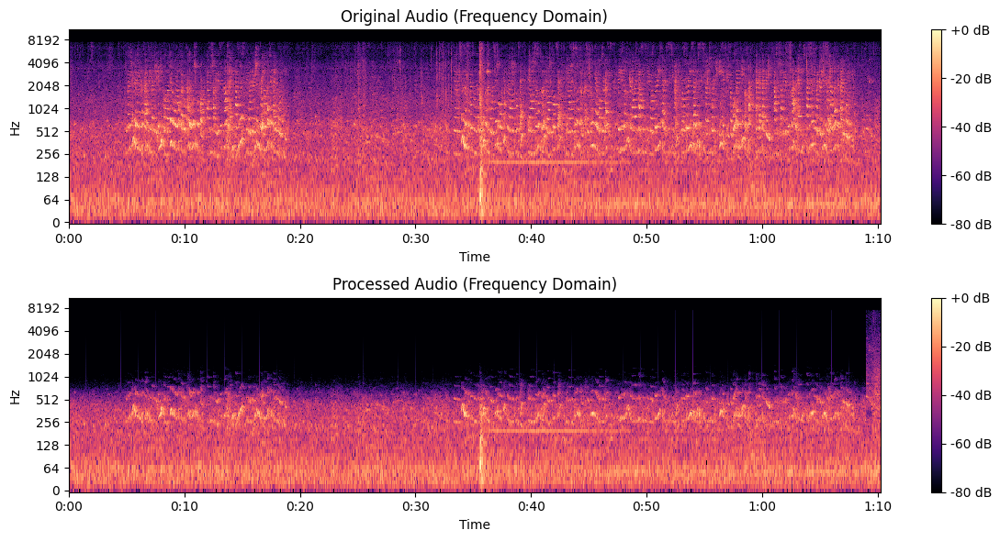

In [ ]:

# Load the original and processed audio files
original_audio, sr = librosa.load('/content/noise_test_AirportAnnouncements_1.wav')
processed_audio, _ = librosa.load('processed_audio2.wav')

# Time domain visualization
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.waveshow(original_audio, sr=sr)
plt.title('Original Audio (Time Domain)')

plt.subplot(2, 1, 2)
librosa.display.waveshow(processed_audio, sr=sr)
plt.title('Processed Audio (Time Domain)')

plt.tight_layout()
plt.show()

# Frequency domain visualization (Spectrogram)
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
D = librosa.amplitude_to_db(np.abs(librosa.stft(original_audio)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Original Audio (Frequency Domain)')

plt.subplot(2, 1, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(processed_audio)), ref=np.max)
librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Processed Audio (Frequency Domain)')

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np

def adaptive_noise_cancellation(noisy_signal, reference_noise, mu=0.01, num_taps=64):
    """
    Perform adaptive noise cancellation using the LMS algorithm.

    Args:
        noisy_signal: The signal with noise (numpy array).
        reference_noise: The reference noise signal (numpy array).
        mu: Step size for the LMS algorithm.
        num_taps: Number of filter coefficients.

    Returns:
        filtered_signal: The output signal after noise cancellation.
    """
    # Initialize filter coefficients and output
    w = np.zeros(num_taps)
    filtered_signal = np.zeros_like(noisy_signal)

    for i in range(num_taps, len(noisy_signal)):
        # Extract reference window
        x = reference_noise[i-num_taps:i]
        # Predict the noise
        predicted_noise = np.dot(w, x)
        # Error signal
        e = noisy_signal[i] - predicted_noise
        # Update weights
        w += mu * e * x
        # Store filtered signal
        filtered_signal[i] = e

    return filtered_signal

In [ ]:
def classify_chunk_with_tf_model(tf_model, audio_chunk):
    """
    Classify an audio chunk using the TensorFlow model.

    Args:
        tf_model: TensorFlow classification model.
        audio_chunk: 1D numpy array of audio data.

    Returns:
        class_idx: Predicted class index.
        class_probabilities: Probabilities for each class.
    """
    # Convert audio chunk to TensorFlow format
    audio_tensor = tf.convert_to_tensor(audio_chunk, dtype=tf.float32)
    #audio_tensor = tf.expand_dims(audio_tensor, axis=0)  # Add batch dimension

    # Predict using the TensorFlow model
    class_probabilities = tf_model(audio_tensor).numpy().squeeze()
    class_idx = tf.argmax(class_probabilities).numpy()

    return class_idx, class_probabilities


In [ ]:
def process_audio_with_anc_tf_model(audio_path, tf_model, chunk_duration=1.0, overlap=0.5, sr=16000, mu=0.01, num_taps=64):
    """
    Process audio with adaptive noise cancellation using a TensorFlow model.

    Args:
        audio_path: Path to the audio file.
        tf_model: TensorFlow classification model.
        chunk_duration: Duration of each audio chunk (seconds).
        overlap: Overlap between chunks (fraction).
        sr: Sampling rate (Hz).
        mu: Step size for the LMS algorithm.
        num_taps: Number of filter coefficients.

    Returns:
        processed_audio: The processed audio after ANC.
    """
    # Load the audio file
    audio, _ = librosa.load(audio_path, sr=sr, mono=True)

    # Simulate reference noise (e.g., using a scaled version of the original)
    reference_noise = audio * 0.5  # Example: Use a scaled version of the original as reference

    # Split audio into chunks
    chunk_size = int(sr * chunk_duration)
    step_size = int(chunk_size * (1 - overlap))
    processed_audio = np.zeros_like(audio)

    for i in range(0, len(audio) - chunk_size + 1, step_size):
        chunk = audio[i:i + chunk_size]
        ref_chunk = reference_noise[i:i + chunk_size]

        # Classify the chunk using TensorFlow model
        class_idx, class_probabilities = classify_chunk_with_tf_model(tf_model, chunk)

        # Apply ANC if classified as unwanted
        if class_idx in [0]:  # Replace `unwanted_classes` with actual class indices
            filtered_chunk = adaptive_noise_cancellation(chunk, ref_chunk, mu, num_taps)
        else:
            filtered_chunk = chunk  # Pass through for wanted classes

        # Overlap-add the processed chunk
        processed_audio[i:i + chunk_size] += filtered_chunk

    return processed_audio, sr


In [ ]:
# Run the pipeline
audio_path = '/content/noise_test_AirConditioner_1.wav'
output_audio, sample_rate = process_audio_with_anc_tf_model(audio_path, reloaded_model, chunk_duration=1.0, overlap=0.5)

# Save the processed audio
sf.write('processed_audio_anc.wav', output_audio, sample_rate)

print("Processed audio saved to 'processed_audio.wav'")

Processed audio saved to 'processed_audio.wav'


In [ ]:
from IPython.display import Audio
Audio('/content/processed_audio_anc.wav')

In [ ]:
import numpy as np
import tensorflow as tf
from scipy.signal import lfilter

# Adaptive noise estimation function
def adaptive_noise_estimation(noisy_chunk, noise_profile, alpha=0.9):
    """
    Update noise profile adaptively based on a noisy chunk.
    Args:
        noisy_chunk (np.ndarray): Current noisy audio chunk.
        noise_profile (np.ndarray): Current noise profile.
        alpha (float): Smoothing factor (0.0 - 1.0, higher = slower updates).
    Returns:
        np.ndarray: Updated noise profile.
    """
    return alpha * noise_profile + (1 - alpha) * noisy_chunk

# Adaptive noise cancellation function
def adaptive_noise_cancellation(noisy_chunk, noise_profile, mu=0.1, num_taps=64):
    """
    Apply adaptive noise cancellation using LMS filter.
    Args:
        noisy_chunk (np.ndarray): Noisy audio chunk.
        noise_profile (np.ndarray): Estimated noise profile.
        mu (float): LMS step size.
        num_taps (int): Number of filter taps.
    Returns:
        np.ndarray: Filtered audio chunk.
    """
    noise_profile = noise_profile[:len(noisy_chunk)]  # Ensure matching length
    adaptive_filter = np.zeros(num_taps)
    filtered_chunk = np.zeros_like(noisy_chunk)

    for n in range(len(noisy_chunk)):
        x_n = noisy_chunk[max(0, n - num_taps + 1):n + 1][::-1]
        if len(x_n) < num_taps:
            x_n = np.pad(x_n, (num_taps - len(x_n), 0), mode='constant')

        y_n = np.dot(adaptive_filter, x_n)
        error = noisy_chunk[n] - y_n
        adaptive_filter += mu * error * x_n
        filtered_chunk[n] = error

    return filtered_chunk

# Processing pipeline with adaptive noise estimation
def process_audio_with_adaptive_anc(audio, sr, model = reloaded_model, chunk_duration=1.0, overlap=0.1, alpha=0.9):
    """
    Process audio with adaptive noise cancellation and dynamic noise estimation.
    Args:
        audio (np.ndarray): Input audio signal.
        sr (int): Sample rate.
        model (tf.keras.Model): Classification model.
        chunk_duration (float): Chunk duration in seconds.
        overlap (float): Overlap ratio between chunks.
        alpha (float): Smoothing factor for noise estimation.
    Returns:
        np.ndarray: Filtered audio signal.
    """
    chunk_size = int(sr * chunk_duration)
    step_size = int(chunk_size * (1 - overlap))
    noise_profile = np.zeros(chunk_size)  # Initialize noise profile
    filtered_audio = []

    for start_idx in range(0, len(audio) - chunk_size + 1, step_size):
        chunk = audio[start_idx:start_idx + chunk_size]

        # Classify the chunk
        input_tensor = tf.convert_to_tensor(chunk, dtype=tf.float32)
        predictions = model(input_tensor)
        class_idx = np.argmax(predictions)
        predicted_class = my_classes[class_idx]

        if predicted_class == "Unwanted":
            # Update noise profile and apply ANC
            noise_profile = adaptive_noise_estimation(chunk, noise_profile, alpha)
            filtered_chunk = adaptive_noise_cancellation(chunk, noise_profile)
        else:
            # Amplify desired chunks (optional)
            filtered_chunk = chunk * 1.2  # Amplify by 20%

        filtered_audio.extend(filtered_chunk)

    return np.array(filtered_audio)

# Example usage
audio_path = "/content/noise_test_AirConditioner_1.wav"
audio, sr = librosa.load(audio_path, sr=16000)
filtered_audio = process_audio_with_adaptive_anc(audio, sr, reloaded_model)

# Save the filtered audio for verification
import soundfile as sf
sf.write("filtered_audio.wav", filtered_audio, sr)


In [ ]:
from IPython.display import Audio
Audio('/content/filtered_audio.wav')

In [ ]:

@tf.function
def load_wav_16k_mono(filename):
    """ Load a WAV file, convert it to a float tensor, resample to 16 kHz single-channel audio. """
    file_contents = tf.io.read_file(filename)
    wav, sample_rate = tf.audio.decode_wav(
          file_contents,
          desired_channels=1)
    wav = tf.squeeze(wav, axis=-1)
    sample_rate = tf.cast(sample_rate, dtype=tf.int64)
    wav = tfio.audio.resample(wav, rate_in=sample_rate, rate_out=16000)
    return wav

# using function to pass only filename to  load_wav_16k_mono from the tensorflow dataset

def load_wav_for_map(filename, label):
  return load_wav_16k_mono(filename),label

In [ ]:
testing_wav_data = load_wav_16k_mono('/content/MS-SNSD/clean_train/p234_001.wav')

_ = plt.plot(testing_wav_data)

# Play the audio file.
display.Audio(testing_wav_data, rate=16000)